In [1]:
%ls 

 C 드라이브의 볼륨에는 이름이 없습니다.
 볼륨 일련 번호: BE61-B85F

 c:\BigData\Opendata 디렉터리

2019-04-07  오전 01:02    <DIR>          .
2019-04-07  오전 01:02    <DIR>          ..
2019-04-06  오후 08:45    <DIR>          .ipynb_checkpoints
2019-03-27  오전 11:42           455,415 Apt_presale_price.ipynb
2019-04-06  오후 06:44    <DIR>          apt_price
2019-04-06  오후 07:07            51,259 apt_price_review.ipynb
2019-03-12  오후 10:49         2,379,098 Commercial_data_analyze.ipynb
2019-04-06  오후 08:48    <DIR>          commercial_info_201812
2019-03-21  오후 10:00    <DIR>          data
2019-04-06  오후 08:42         9,024,060 store_location_by_folium.ipynb
2019-04-07  오전 01:02        14,924,686 store_location_review.ipynb
               5개 파일          26,834,518 바이트
               6개 디렉터리  13,828,698,112 바이트 남음


In [2]:
%ls commercial_info_201812

 C 드라이브의 볼륨에는 이름이 없습니다.
 볼륨 일련 번호: BE61-B85F

 c:\BigData\Opendata\commercial_info_201812 디렉터리

2019-04-06  오후 08:48    <DIR>          .
2019-04-06  오후 08:48    <DIR>          ..
2019-02-12  오후 02:48        42,574,428 commercial_static_2017_.csv
2019-02-01  오후 05:27       229,866,473 commercial_store_201812_1.csv
2019-04-06  오후 08:48       270,207,493 commercial_store_201812_1_1.csv
2019-02-01  오후 05:46       209,719,479 commercial_store_201812_2.csv
2019-02-01  오후 05:53       350,993,669 commercial_store_201812_3.csv
2019-02-01  오후 05:54       319,466,329 commercial_store_201812_4.csv
               6개 파일       1,422,827,871 바이트
               2개 디렉터리  13,828,673,536 바이트 남음


In [3]:
import pandas as pd
import numpy as np
from plotnine import *
import folium
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
shop_2018 = pd.read_csv('C://BigData/Opendata/commercial_info_201812/commercial_store_201812_1_1.csv', encoding='utf-8')
shop_2018.shape

(500527, 39)

In [5]:
shop_2018.head()

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
0,19905471,와라와라호프,NaN,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,I56219,...,1168010600106040000014378,대치상가,서울특별시 강남구 남부순환로 2933,135280,6280.0,NaN,1,NaN,127.061026,37.493922
1,19911397,커피빈코리아선릉로93길점,코리아선릉로93길점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1168010100106960042022041,NaN,서울특별시 강남구 선릉로93길 6,135080,6149.0,NaN,1,NaN,127.047883,37.505675
2,19911801,프로포즈,NaN,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,I56219,...,1154510200101620001017748,NaN,서울특별시 금천구 가산로 34-6,153010,8545.0,NaN,1,NaN,126.899220,37.471711
3,19912201,싱싱커피&토스트,NaN,Q,음식,Q07,패스트푸드,Q07A10,토스트전문,I56192,...,2653010400105780000002037,산업용품유통상가,부산광역시 사상구 괘감로 37,617726,46977.0,NaN,1,26,128.980455,35.159774
4,19932756,가락사우나내스낵,NaN,F,생활서비스,F09,대중목욕탕/휴게,F09A02,사우나/증기탕/온천,S96121,...,1171010500102560005010490,NaN,서울특별시 송파구 가락로 71,138846,5690.0,NaN,1,NaN,127.104071,37.500249


In [6]:
shop_2018.tail()

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
500522,16141434,배스킨라빈스31,건대스타시티점,Q,음식,Q07,패스트푸드,Q07A07,아이스크림판매,I56191,...,1121510500102270007022407,더샵스타시티,서울특별시 광진구 아차산로 262,143730,5065.0,NaN,NaN,NaN,127.072944,37.536997
500523,16093390,본도시락,본설렁탕,Q,음식,Q01,한식,Q01A09,설렁탕집,I56111,...,1174010900105020000000001,강동타워,서울특별시 강동구 상일로6길 39,134100,5288.0,NaN,NaN,NaN,127.175331,37.549794
500524,16093078,체크페이먼트,NaN,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1168010600109050000028207,성아빌딩,서울특별시 강남구 역삼로69길 10,135841,6196.0,NaN,NaN,NaN,127.054001,37.502210
500525,16093122,마젠타네일,NaN,F,생활서비스,F01,이/미용/건강,F01A02,발/네일케어,S96119,...,1144010200104630000002585,마포현대하이엘,서울특별시 마포구 마포대로 173,121862,4130.0,NaN,1,NaN,126.954442,37.549892
500526,16093154,GS25,역촌대로점,D,소매,D03,종합소매점,D03A01,편의점,G47122,...,1138010800100090007000001,서부빌딩,서울특별시 은평구 연서로 92,122895,3401.0,NaN,1,NaN,126.915538,37.607334


In [7]:
shop_2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500527 entries, 0 to 500526
Data columns (total 39 columns):
상가업소번호       500527 non-null int64
상호명          500526 non-null object
지점명          67924 non-null object
상권업종대분류코드    500527 non-null object
상권업종대분류명     500527 non-null object
상권업종중분류코드    500527 non-null object
상권업종중분류명     500527 non-null object
상권업종소분류코드    500527 non-null object
상권업종소분류명     500527 non-null object
표준산업분류코드     471720 non-null object
표준산업분류명      471720 non-null object
시도코드         500527 non-null int64
시도명          500527 non-null object
시군구코드        500527 non-null int64
시군구명         500527 non-null object
행정동코드        500527 non-null int64
행정동명         500527 non-null object
법정동코드        500527 non-null int64
법정동명         500527 non-null object
지번코드         500527 non-null int64
대지구분코드       500527 non-null int64
대지구분명        500527 non-null object
지번본번지        500527 non-null int64
지번부번지        413751 non-null float64
지번주소         500527 non-null obje

In [8]:
shop_2018.isnull().sum()

상가업소번호            0
상호명               1
지점명          432603
상권업종대분류코드         0
상권업종대분류명          0
상권업종중분류코드         0
상권업종중분류명          0
상권업종소분류코드         0
상권업종소분류명          0
표준산업분류코드      28807
표준산업분류명       28807
시도코드              0
시도명               0
시군구코드             0
시군구명              0
행정동코드             0
행정동명              0
법정동코드             0
법정동명              0
지번코드              0
대지구분코드            0
대지구분명             0
지번본번지             0
지번부번지         86776
지번주소              0
도로명코드             0
도로명               0
건물본번지             0
건물부번지        435556
건물관리번호            0
건물명          274799
도로명주소             0
구우편번호             0
신우편번호             9
동정보          456393
층정보          191843
호정보          428338
경도                0
위도                0
dtype: int64

In [9]:
conveinence = shop_2018[shop_2018['상권업종소분류명'].str.contains('편의점')]
conveinence.shape

(11133, 39)

In [10]:
conveinence.columns

Index(['상가업소번호', '상호명', '지점명', '상권업종대분류코드', '상권업종대분류명', '상권업종중분류코드',
       '상권업종중분류명', '상권업종소분류코드', '상권업종소분류명', '표준산업분류코드', '표준산업분류명', '시도코드',
       '시도명', '시군구코드', '시군구명', '행정동코드', '행정동명', '법정동코드', '법정동명', '지번코드',
       '대지구분코드', '대지구분명', '지번본번지', '지번부번지', '지번주소', '도로명코드', '도로명', '건물본번지',
       '건물부번지', '건물관리번호', '건물명', '도로명주소', '구우편번호', '신우편번호', '동정보', '층정보',
       '호정보', '경도', '위도'],
      dtype='object')

In [11]:
conveinence['상호명'].unique

<bound method Series.unique of 243                코리아세븐하단제휴점
501                        GS
511                 GS25해운리베라
598                 미니스톱반송삼한점
707                   CU역삼달샘점
749             세븐일레븐대치코스모스점B
854                 GS25당리행운점
912                      까치마트
1007                     GS25
1028                 GS25안암학사
1039                     GS25
1066             탑훼미리마트괴정잠괴정점
1148      비지에프리테일서울산업대제2학생회관점
1393                       CU
1540                미니스톱등촌청림점
1580                  GS25부곡점
1600                    세븐일레븐
1682                지에스25용마파크
1849                    세븐일레븐
1880                    편의점사랑
1928                     미니스톱
1945                   씨유대치우일
1967                 GS25강남센타
1972                미니스톰논현힐탑점
2038                미니스톱논현역2점
2134                       CU
2211                  씨유장안플러스
2213                      G마트
2236                   인더라인25
2316                     GN24
                 ...         
492829                  부산위드미
493265   

In [12]:
conveinence.loc[conveinence['상호명'].str.contains('CU'),'상호명'].unique()

array(['CU역삼달샘점', 'CU', 'CU동국대기숙사점', 'CU상도삼성점', 'CU까치산점', 'CU월곡솔하임점',
       'CU성수한진점', 'CU편의점역삼역촌', 'CU큐브플러스점', 'CU하단로또일등점', 'CU신내중앙점',
       'CU기계공구단지본관점', 'CU강서미음점', 'CU구포테라스점', 'CU거여청솔점',
       'CUSHAN&WAKEFIELD', 'ACUVA', 'CU오금공원점', 'CU상도역점', 'CU마들역점',
       'CU화곡우리마을점', 'CU관악서원점', 'CU이대목동병원점', 'CU건대원룸촌점', 'CU편의점',
       '수다CUP&TEA', 'CU서초중앙로점', '에프엠CUSTOM', 'CU오금역점', 'ACCUDIGM',
       '도쿄CUISINE', 'CU성내제일점', 'CU방배이수역점', 'CU낙성대입구', '서울대학교CU301동점',
       'CU괘법한신점', 'CU영등포자매점', 'CU동소문중앙점', 'CU목동하이베라스점', 'CU한신IT',
       'CU행당두산점', 'CU삼성대웅', 'CU흑석로점', 'CU연희서연점', 'CU동의의료원점', 'CU신당백석점',
       'BARCU', 'CU신정푸른점', 'CU한강잠실2호점', 'CU서울대우신점', 'CU삼성럭키점', 'CU명지원룸점',
       'CU마포연남점', 'CU남부터미널역점', 'CU노량진삼익점', 'CU북아현추계점', 'CU괴정벽산점', 'CU신호점',
       'CU마트', 'CU신촌대현점', 'CUSK오천주유소점', 'CU관악신사로점', 'CU고척리가점',
       'CU강동천호대로점', 'CU성신로데오점', 'CU도봉오봉점', 'CU구로파트너점', 'CU신림행운점',
       'CU우이중앙점', 'CU논현학동점', 'CU관악장원점', 'CU도선홍익점', 'CU관악프렌즈점', 'CU공덕삼성점',
       'CU광진능동로점', 'CU신도림포스빌점', 'CUSK중랑교주유소점', '

In [13]:
conveinence['시도명'].isnull().sum()

0

In [14]:
conveinence['시도명'].value_counts()

서울특별시    8406
부산광역시    2727
Name: 시도명, dtype: int64

In [15]:
conveinence['상권업종소분류명'].value_counts()

편의점    11133
Name: 상권업종소분류명, dtype: int64

In [16]:
df_seoul = shop_2018.loc[shop_2018['시도명'].str.contains('서울')].copy()
df_seoul.head()

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
0,19905471,와라와라호프,NaN,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,I56219,...,1168010600106040000014378,대치상가,서울특별시 강남구 남부순환로 2933,135280,6280.0,NaN,1,NaN,127.061026,37.493922
1,19911397,커피빈코리아선릉로93길점,코리아선릉로93길점,Q,음식,Q12,커피점/카페,Q12A01,커피전문점/카페/다방,I56220,...,1168010100106960042022041,NaN,서울특별시 강남구 선릉로93길 6,135080,6149.0,NaN,1,NaN,127.047883,37.505675
2,19911801,프로포즈,NaN,Q,음식,Q09,유흥주점,Q09A01,호프/맥주,I56219,...,1154510200101620001017748,NaN,서울특별시 금천구 가산로 34-6,153010,8545.0,NaN,1,NaN,126.899220,37.471711
4,19932756,가락사우나내스낵,NaN,F,생활서비스,F09,대중목욕탕/휴게,F09A02,사우나/증기탕/온천,S96121,...,1171010500102560005010490,NaN,서울특별시 송파구 가락로 71,138846,5690.0,NaN,1,NaN,127.104071,37.500249
5,19975850,허술한집,NaN,Q,음식,Q04,분식,Q04A01,라면김밥분식,I56194,...,1150010800100450031005883,NaN,서울특별시 강서구 공항대로3길 9,157812,7619.0,NaN,1,NaN,126.809957,37.562013


In [17]:
df_seoul.isnull().sum()

상가업소번호            0
상호명               0
지점명          295868
상권업종대분류코드         0
상권업종대분류명          0
상권업종중분류코드         0
상권업종중분류명          0
상권업종소분류코드         0
상권업종소분류명          0
표준산업분류코드      20018
표준산업분류명       20018
시도코드              0
시도명               0
시군구코드             0
시군구명              0
행정동코드             0
행정동명              0
법정동코드             0
법정동명              0
지번코드              0
대지구분코드            0
대지구분명             0
지번본번지             0
지번부번지         67123
지번주소              0
도로명코드             0
도로명               0
건물본번지             0
건물부번지        304059
건물관리번호            0
건물명          180914
도로명주소             0
구우편번호             0
신우편번호             2
동정보          320099
층정보          103184
호정보          297845
경도                0
위도                0
dtype: int64

In [18]:
df_seoul['상권업종소분류명'].value_counts()

한식/백반/한정식      23863
커피전문점/카페/다방    16127
여성미용실          16020
부동산중개          12537
일반의류            9722
편의점             8406
종합소매            7555
호프/맥주           7366
라면김밥분식          6522
학원-입시           6350
비만/피부관리         5495
세탁소/빨래방         5397
화장품판매점          5006
후라이드/양념치킨       4393
수퍼마켓            4366
어린이집            4325
갈비/삼겹살          4253
학원(종합)          4075
노래방             3803
정통양식/경양식        3552
제과점             3482
인쇄종합            3474
자동차정비/카센타       3295
핸드폰소매           3090
약국              3024
학원-외국어/어학       2952
중국음식/중국집        2712
발/네일케어          2686
피아노/바이올린/기타     2569
국수/만두/칼국수       2533
               ...  
학원-간판디자인           1
실내스케이트장            1
학원-편물기술            1
현미경/망원경판매          1
특수사진기              1
채식/한식부페            1
실외야구연습장            1
미용실-어린이            1
음악감상               1
토종닭전문              1
주말농장               1
지점토판매              1
볼링용품판매             1
회갑연서비스             1
파라솔판매              1
종교서적판매             1
제기용품판매       

In [19]:
df_seoul[['경도','위도']].describe()

,경도,위도
count,346131.000000,346131.000000
mean,126.994665,37.545310
std,0.081640,0.049124
min,126.768169,37.434081
25%,126.924830,37.504903
50%,127.008049,37.542095
75%,127.055645,37.573373
max,127.182588,37.692398


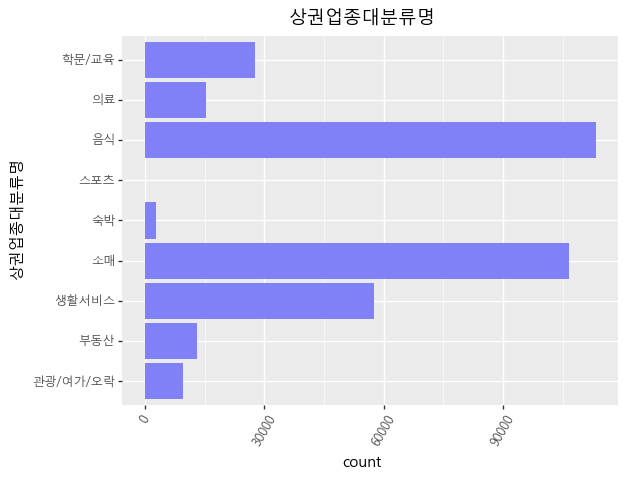

<ggplot: (-9223371901355685586)>

In [20]:
from matplotlib import font_manager,rc
path = "C://Windows/Fonts/malgun.ttf"
font_name= font_manager.FontProperties(fname=path).get_name()
rc('font',family=font_name)

(ggplot(df_seoul)
 + aes('상권업종대분류명')
 + geom_bar(fill='#8181F7')
 + ggtitle('상권업종대분류명')
 + coord_flip()
 + theme(text=element_text(family=font_name), axis_text_x = element_text(rotation=60))
)

In [21]:
df_conv= df_seoul.loc[df_seoul['상권업종대분류명'].str.contains('소매')]
df_conv.head()

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
12,19974666,신호건강원,NaN,D,소매,D10,건강/미용식품,D10A07,건강원,G47216,...,1150010300103690053013643,NaN,서울특별시 강서구 가로공원로82길 42-3,157010,7765.0,NaN,1,NaN,126.840285,37.535419
14,19999875,제이씨코퍼레이션,NaN,D,소매,D02,선물/팬시/기념품,D02A05,토산품/기념품점,G47842,...,1156012700100240000037460,삼천리아파트,서울특별시 영등포구 선유서로 115,150103,7269.0,101,1,804,126.885320,37.526139
61,20727381,한일지도판매,NaN,D,소매,D13,책/서적/도서,D13A13,지도판매,G47611,...,1168010100107460010024407,NaN,서울특별시 강남구 논현로 415,135080,6246.0,NaN,NaN,2,127.038310,37.497200
68,20622823,인덕기름집,NaN,D,소매,D01,음/식료품소매,D01A01,식료품점,G47219,...,1135010200102850001018636,성천감리교회,서울특별시 노원구 월계로53길 1,139050,1879.0,NaN,NaN,NaN,127.058712,37.630341
72,20787543,자임한복,NaN,D,소매,D05,의복의류,D05A10,한복/갈옷/민속옷,G47412,...,1168010700105860013011251,NaN,서울특별시 강남구 도산대로27길 26,135892,6032.0,NaN,1,NaN,127.027614,37.521423


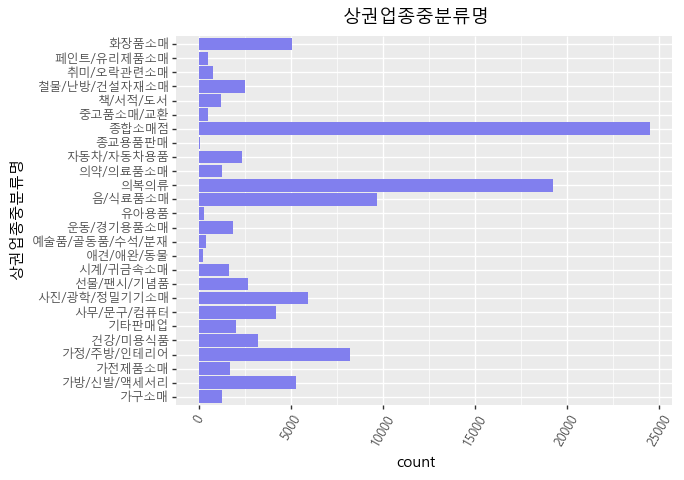

<ggplot: (135500494333)>

In [22]:
(ggplot(df_conv)
 +aes('상권업종중분류명')
 +geom_bar(fill='#817FEE')
 +ggtitle('상권업종중분류명')
 +coord_flip()
 +theme(text=element_text(family=font_name), axis_text_x=element_text(rotation=60))
)

In [23]:
df_retail = df_seoul.loc[df_seoul['상권업종중분류명']=='종합소매점']
df_retail.shape

(24469, 39)

In [24]:
df_retail.head()

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
265,21779852,개전리구판장,NaN,D,소매,D03,종합소매점,D03B06,구판장/직판장,G47129,...,1141011300101260025000001,NaN,서울특별시 서대문구 봉원사길 22,120160,3721.0,NaN,1,NaN,126.946495,37.567698
320,22489789,주영상회,NaN,D,소매,D03,종합소매점,D03A03,잡화점,G47190,...,1162010200103540027011152,NaN,서울특별시 관악구 양지11길 4-5,151015,8846.0,6,1,10,126.928246,37.469761
339,22492536,메가마트물류센터,NaN,D,소매,D03,종합소매점,D03A02,수퍼마켓,G47121,...,1154510300109840033000001,NaN,서울특별시 금천구 시흥대로27길 32,153030,8639.0,NaN,1,NaN,126.901561,37.440791
369,22414893,신원글로벌,NaN,D,소매,D03,종합소매점,D03A03,잡화점,G47190,...,1117013100107470007000145,하얏트호텔,서울특별시 용산구 소월로 322,140738,4347.0,NaN,1,NaN,126.996224,37.539758
377,22319925,양평슈퍼,NaN,D,소매,D03,종합소매점,D03A02,수퍼마켓,G47121,...,1121510900103490009019298,NaN,서울특별시 광진구 동일로36길 23,143840,5002.0,NaN,1,NaN,127.070040,37.551292


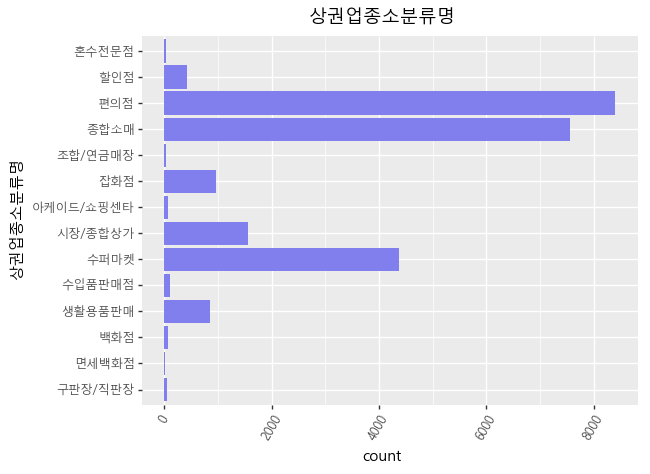

<ggplot: (-9223371901354225948)>

In [25]:
(ggplot(df_retail)
 +aes('상권업종소분류명')
 +geom_bar(fill='#817FEE')
 +ggtitle('상권업종소분류명')
 +coord_flip()
 +theme(text=element_text(family=font_name), axis_text_x = element_text(rotation=60))
)

In [26]:
df_constore = df_seoul.loc[df_seoul['상권업종소분류명']=='편의점']
df_constore.shape

(8406, 39)

In [27]:
df_constore.head()

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
501,22557422,GS,천호삼성점,D,소매,D03,종합소매점,D03A01,편의점,G47122,...,1174010900101690013010467,NaN,서울특별시 강동구 성안로25길 21,134020,5338.0,NaN,1,NaN,127.134360,37.538247
707,25471219,CU역삼달샘점,역삼달샘점,D,소매,D03,종합소매점,D03A01,편의점,G47122,...,1168010100106370041026180,NaN,서울특별시 강남구 테헤란로19길 29,135080,6131.0,NaN,1,NaN,127.032799,37.501885
749,25305326,세븐일레븐대치코스모스점B,NaN,D,소매,D03,종합소매점,D03A01,편의점,G47122,...,1168010600110010006012108,NaN,서울특별시 강남구 영동대로86길 10,135280,6174.0,NaN,1,NaN,127.064890,37.507793
912,25590598,까치마트,NaN,D,소매,D03,종합소매점,D03A01,편의점,G47122,...,1150010300103430002023769,NaN,서울특별시 강서구 강서로 49,157010,7774.0,NaN,1,NaN,126.846174,37.532143
1028,2933828,GS25안암학사,NaN,D,소매,D03,종합소매점,D03A01,편의점,G47122,...,1129012500100010002040548,NaN,서울특별시 성북구 인촌로 105,136701,2842.0,NaN,1,NaN,127.030958,37.586488


In [28]:
df_constore.columns

Index(['상가업소번호', '상호명', '지점명', '상권업종대분류코드', '상권업종대분류명', '상권업종중분류코드',
       '상권업종중분류명', '상권업종소분류코드', '상권업종소분류명', '표준산업분류코드', '표준산업분류명', '시도코드',
       '시도명', '시군구코드', '시군구명', '행정동코드', '행정동명', '법정동코드', '법정동명', '지번코드',
       '대지구분코드', '대지구분명', '지번본번지', '지번부번지', '지번주소', '도로명코드', '도로명', '건물본번지',
       '건물부번지', '건물관리번호', '건물명', '도로명주소', '구우편번호', '신우편번호', '동정보', '층정보',
       '호정보', '경도', '위도'],
      dtype='object')

In [29]:
df_constore['상호명'].unique()

array(['GS', 'CU역삼달샘점', '세븐일레븐대치코스모스점B', ..., '단지', 'G-cut', '향'],
      dtype=object)

In [30]:
df_constore['상호명'].value_counts()

CU              1469
GS25            1349
세븐일레븐            862
미니스톱             193
위드미              125
이마트               47
STORYWAY          24
365플러스편의점         19
인더라인25            13
씨스페이스             13
로그인               12
베스트올              11
편의점사랑             11
24시편의점            10
아이지에이마트            8
로그인편의점             8
GS25시              8
GS                 8
조이마트               7
gs25               7
GS25편의점            7
개그스토리마트            5
아이지에이              5
IGA마트              5
C&U                4
GS수퍼마켓             4
CU편의점              4
OK마트               4
편의점                4
레몬비                4
                ... 
GS25광장삼성점          1
세븐일레븐가락으뜸점         1
세븐일레븐편의점           1
세븐일레븐아현점           1
위드미중곡타운점           1
세븐일레븐사당동작점         1
플랙진디큐브시티점          1
GS25고대중도관          1
코리아세븐신길정원          1
GS25노원수락산역점        1
GS25염창사랑           1
GS25공항로캐슬          1
씨유청담강변             1
씨유매봉산              1
GS25길음동부점          1
GS25대치3호점          1
세븐일레븐종로창경궁로점 

In [31]:
df_constore['브랜드명'] = ''

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [32]:
df_constore[['상호명','브랜드명']].head()

,상호명,브랜드명
501,GS,
707,CU역삼달샘점,
749,세븐일레븐대치코스모스점B,
912,까치마트,
1028,GS25안암학사,


In [33]:
df_constore.loc[df_constore['상호명'].str.contains('GS'),'브랜드명'] = 'GS25'
df_constore.loc[df_constore['상호명'].str.contains('CU'),'브랜드명'] = 'CU'
df_constore.loc[df_constore['상호명'].str.contains('세븐'),'브랜드명'] = '세븐일레븐'
df_constore.loc[df_constore['상호명'].str.contains('미니'),'브랜드명'] = '미니스톱'

C:\Anaconda3\lib\site-packages\pandas\core\indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [34]:
df_constore[['상호명','브랜드명']].head()

,상호명,브랜드명
501,GS,GS25
707,CU역삼달샘점,CU
749,세븐일레븐대치코스모스점B,세븐일레븐
912,까치마트,
1028,GS25안암학사,GS25


In [35]:
df_constore['브랜드명'].value_counts()

GS25     2583
CU       2121
         1714
세븐일레븐    1659
미니스톱      329
Name: 브랜드명, dtype: int64

In [36]:
df_constore.shape

(8406, 40)

In [37]:
df_constore.head()

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도,브랜드명
501,22557422,GS,천호삼성점,D,소매,D03,종합소매점,D03A01,편의점,G47122,...,NaN,서울특별시 강동구 성안로25길 21,134020,5338.0,NaN,1,NaN,127.134360,37.538247,GS25
707,25471219,CU역삼달샘점,역삼달샘점,D,소매,D03,종합소매점,D03A01,편의점,G47122,...,NaN,서울특별시 강남구 테헤란로19길 29,135080,6131.0,NaN,1,NaN,127.032799,37.501885,CU
749,25305326,세븐일레븐대치코스모스점B,NaN,D,소매,D03,종합소매점,D03A01,편의점,G47122,...,NaN,서울특별시 강남구 영동대로86길 10,135280,6174.0,NaN,1,NaN,127.064890,37.507793,세븐일레븐
912,25590598,까치마트,NaN,D,소매,D03,종합소매점,D03A01,편의점,G47122,...,NaN,서울특별시 강서구 강서로 49,157010,7774.0,NaN,1,NaN,126.846174,37.532143,
1028,2933828,GS25안암학사,NaN,D,소매,D03,종합소매점,D03A01,편의점,G47122,...,NaN,서울특별시 성북구 인촌로 105,136701,2842.0,NaN,1,NaN,127.030958,37.586488,GS25


In [38]:
df_constore.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8406 entries, 501 to 500526
Data columns (total 40 columns):
상가업소번호       8406 non-null int64
상호명          8406 non-null object
지점명          6698 non-null object
상권업종대분류코드    8406 non-null object
상권업종대분류명     8406 non-null object
상권업종중분류코드    8406 non-null object
상권업종중분류명     8406 non-null object
상권업종소분류코드    8406 non-null object
상권업종소분류명     8406 non-null object
표준산업분류코드     8406 non-null object
표준산업분류명      8406 non-null object
시도코드         8406 non-null int64
시도명          8406 non-null object
시군구코드        8406 non-null int64
시군구명         8406 non-null object
행정동코드        8406 non-null int64
행정동명         8406 non-null object
법정동코드        8406 non-null int64
법정동명         8406 non-null object
지번코드         8406 non-null int64
대지구분코드       8406 non-null int64
대지구분명        8406 non-null object
지번본번지        8406 non-null int64
지번부번지        6594 non-null float64
지번주소         8406 non-null object
도로명코드        8406 non-null int64
도로명          

In [39]:

geo_df = df_constore.copy()

# 지도를 초기화 해줄 때 어디를 중심으로 보여줄지 설정.
# 우리가 가져온 데이터프레임 안에 있는 데이터를 기준으로 출력할 수 있도록 위경도의 평균값을 구해옴

map = folium.Map(location=[geo_df['위도'].mean(),geo_df['경도'].mean()], zoom_start=12 )

for n in geo_df.index:
    #팝업에 들어갈 텍스트를 지정
    popup_name = geo_df['브랜드명'][n] + ' - ' + geo_df['도로명주소'][n]
    #브랜드명에 따라 아이콘 색상을 달리해서 찍어줌
    if geo_df['브랜드명'][n] == 'CU':
        icon_color = 'puple'
    elif geo_df['브랜드명'][n] == 'GS25':
        icon_color = 'blue'
    elif geo_df['브랜드명'][n] == '미니스톱':
        icon_color = 'yellow'
    elif geo_df['브랜드명'][n] == '세븐일레븐':
        icon_color = 'green'   
        
    folium.Marker([geo_df['위도'][n], geo_df['경도'][n]],
                  popup=popup_name, icon=folium.Icon(color=icon_color)).add_to(map)
    
map

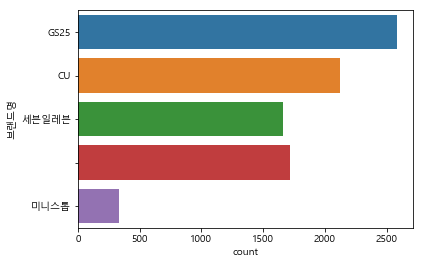

In [40]:
sns.countplot(y='브랜드명', data=df_constore)

In [42]:
df_condf_count = pd.DataFrame(df_constore['브랜드명'].value_counts())
df_condf_percent = pd.DataFrame(df_constore['브랜드명'].value_counts(normalize=True))
df_condf_merge = df_condf_count.merge(df_condf_percent, left_index=True, right_index=True)
df_condf_merge.columns=['브랜드명','비율']
df_condf_merge

,브랜드명,비율
GS25,2583,0.307281
CU,2121,0.252320
,1714,0.203902
세븐일레븐,1659,0.197359
미니스톱,329,0.039139
